# Load modules
[#Load-ensemble-mean](#Load-ensemble-mean)  
[#Check-monthly-data](#Check-monthly-data)  
[#Annual-Climatology](#Annual-Climatology)  
[#Bias](#Bias)  
[#Annual-cycle-ensemble-mean](#Annual-cycle-ensemble-mean)  
[#Time-series](#Time-series)  
[#Trends](#Trends)  
[#Link-with-orography?](#Link-with-orography?)  

In [1]:
# To reload external files automatically (ex: utils)
%load_ext autoreload
%autoreload 2

import xarray as xr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle # For rectangles
import proplot as plot # New plot library (https://proplot.readthedocs.io/en/latest/)
from scipy import stats # For linregress (trends)
import xesmf as xe # For regridding (https://xesmf.readthedocs.io/en/latest/)

import sys
sys.path.insert(1, '../../../') # to include my util file in previous directory
import utils as u # my personal functions
u.check_python_version()
u.check_virtual_memory()

3.8.2 | packaged by conda-forge | (default, Feb 28 2020, 17:15:22) 
[GCC 7.3.0]
Virtual memory usage - total: 252 GB / available: 228 GB / percent used: 9.3 %


# Load model data

In [2]:
# Define period
period = slice('1981','2014')

# Define zone
latlim=(10,50)
lonlim=(60,110)

# Model
institute = 'IPSL'
model = 'IPSL-CM6A-LR'
var = 'pr'
if var in ['tas', 'pr']:
    table = 'Amon'
elif var in ['snc']:
    table = 'LImon'
    
var_label = 'Total precipitation [mm/day]'
var_label_trends = 'Total precipitation trends [mm/day/dec]'
var_label_bias = 'Total precipitation bias [mm/day]'
cmap='DryWet'
levels=plot.arange(0,10,0.5)

# Load ensemble mean
[#Load-ensemble-mean](#Load-ensemble-mean)  
[#Check-monthly-data](#Check-monthly-data)  
[#Annual-Climatology](#Annual-Climatology)  
[#Bias](#Bias)  
[#Annual-cycle-ensemble-mean](#Annual-cycle-ensemble-mean)  
[#Time-series](#Time-series)  
[#Trends](#Trends)  
[#Link-with-orography?](#Link-with-orography?) 

In [3]:
realization = 'ens'
# Load historical ens
experiment='historical'
da_historical = xr.open_dataarray(
    '/data/mlalande/bdd/CMIP6/CMIP/'+institute+'/'+model+'/'+experiment+'/'+realization+'/'+table+'/'+var+'/gr/latest/'+\
    var+'_'+table+'_'+model+'_'+experiment+'_'+realization+'_gr_198101-201412.nc'
)
# Load amip ens
experiment='amip'
da_amip = xr.open_dataarray(
    '/data/mlalande/bdd/CMIP6/CMIP/'+institute+'/'+model+'/'+experiment+'/'+realization+'/'+table+'/'+var+'/gr/latest/'+\
    var+'_'+table+'_'+model+'_'+experiment+'_'+realization+'_gr_198101-201412.nc'
)

# No ensembles for land-hist and HR
realization = 'r1i1p1f1'
# Load land-hist
da_land_hist = xr.open_mfdataset(
    '/bdd/CMIP6/LS3MIP/'+institute+'/'+model+'/land-hist/'+realization+'/'+table+'/'+var+'/gr/latest/*.nc', combine='by_coords'
).sel(time=period)[var]
# Load HighResMIP
da_HR = xr.open_mfdataset(
    '/bdd/CMIP6/HighResMIP/'+institute+'/IPSL-CM6A-ATM-HR/highresSST-present/'+realization+'/'+table+'/'+var+'/gr/latest/*.nc', combine='by_coords'
).sel(time=period)[var]

## Convert units

In [4]:
# To mm/day
da_historical = da_historical*86400
da_amip = da_amip*86400
da_land_hist = da_land_hist*86400
da_HR = da_HR*86400

# Load obs

## APHRODITE http://aphrodite.st.hirosaki-u.ac.jp/download/data/search/  
http://aphrodite.st.hirosaki-u.ac.jp/download/
V1101 et V1101EX_R1 domain MA

Je pense que c'est ok de prendre ces deux là, car c'est la même version du coup même méthode ?

In [5]:
obs_longname = 'APHRODITE V1101 (0.5°)'
obs_name = 'APHRODITE'

In [6]:
obs_V1101 = xr.open_mfdataset(
    '/data/mlalande/APHRODITE/APHRO_MA_050deg_V1101.*.nc', combine='by_coords'
).precip

obs_V1101_EXR1 = xr.open_mfdataset(
    '/data/mlalande/APHRODITE/APHRO_MA_050deg_V1101_EXR1.*.nc', combine='by_coords'
).precip

obs_V1101 = obs_V1101.rename({'longitude': 'lon', 'latitude': 'lat'})
obs = xr.combine_nested([obs_V1101, obs_V1101_EXR1], concat_dim='time')
obs = obs.resample(time='1MS').mean('time')
obs

<xarray.DataArray 'precip' (time: 408, lat: 140, lon: 180)>
dask.array<stack, shape=(408, 140, 180), dtype=float32, chunksize=(1, 140, 180), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) datetime64[ns] 1981-01-01 1981-02-01 ... 2014-12-01
  * lat      (lat) float64 -14.75 -14.25 -13.75 -13.25 ... 53.75 54.25 54.75
  * lon      (lon) float64 60.25 60.75 61.25 61.75 ... 148.2 148.8 149.2 149.8

### Regrid using xESMF (https://xesmf.readthedocs.io/en/latest/) 

In [7]:
# For adding NaN values outside of the grid, otherwise it puts 0 (see issue just up #15)
import scipy
def add_matrix_NaNs(regridder):
    X = regridder.weights
    M = scipy.sparse.csr_matrix(X)
    num_nonzeros = np.diff(M.indptr)
    M[num_nonzeros == 0, 0] = np.NaN
    regridder.weights = scipy.sparse.coo_matrix(M)
    return regridder

# Make the regrider
regridder_obs = xe.Regridder(obs, da_historical, 'bilinear', periodic=False, reuse_weights=True)
regridder_obs = add_matrix_NaNs(regridder_obs)
print(regridder_obs)

# Regrid the data
obs_regrid = regridder_obs(obs)

Reuse existing file: bilinear_140x180_143x144.nc


/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/scipy/sparse/_index.py:126: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


xESMF Regridder 
Regridding algorithm:       bilinear 
Weight filename:            bilinear_140x180_143x144.nc 
Reuse pre-computed weights? True 
Input grid shape:           (140, 180) 
Output grid shape:          (143, 144) 
Output grid dimension name: ('lat', 'lon') 
Periodic in longitude?      False


### Regrid HR

In [8]:
# Regrid HighResMIP
regridder_HR = xe.Regridder(da_HR, da_historical, 'bilinear', periodic=True, reuse_weights=True)
print(regridder_HR)

# Regrid the data
da_HR_regrid = regridder_HR(da_HR)

Reuse existing file: bilinear_361x512_143x144_peri.nc
xESMF Regridder 
Regridding algorithm:       bilinear 
Weight filename:            bilinear_361x512_143x144_peri.nc 
Reuse pre-computed weights? True 
Input grid shape:           (361, 512) 
Output grid shape:          (143, 144) 
Output grid dimension name: ('lat', 'lon') 
Periodic in longitude?      True


## Load ERA-Interim
- ERA-Interim (https://www.ecmwf.int/en/forecasts/datasets/reanalysis-datasets/era-interim)

In [9]:
era = xr.open_mfdataset('/data/mlalande/ERAI/tp/tp_ERAI_*.nc', combine='by_coords').tp.sel(time=period).load()
era

<xarray.DataArray 'tp' (time: 408, latitude: 241, longitude: 480)>
array([[[3.2924302e-04, 3.2924302e-04, 3.2924302e-04, ...,
         3.2924302e-04, 3.2924302e-04, 3.2924302e-04],
        [3.4543499e-04, 3.4453534e-04, 3.4453534e-04, ...,
         3.4363568e-04, 3.4453534e-04, 3.4453534e-04],
        [3.3464096e-04, 3.3464096e-04, 3.3464096e-04, ...,
         3.3014268e-04, 3.3104233e-04, 3.3284165e-04],
        ...,
        [2.0420365e-04, 2.0420365e-04, 2.0330399e-04, ...,
         2.0690262e-04, 2.0600297e-04, 2.0510331e-04],
        [2.2039562e-04, 2.2039562e-04, 2.2039562e-04, ...,
         2.2129528e-04, 2.2039562e-04, 2.2039562e-04],
        [1.7991476e-04, 1.7991476e-04, 1.7991476e-04, ...,
         1.7991476e-04, 1.7991476e-04, 1.7991476e-04]],

       [[4.3269433e-04, 4.3269433e-04, 4.3269433e-04, ...,
         4.3269433e-04, 4.3269433e-04, 4.3269433e-04],
        [4.7587231e-04, 4.7497265e-04, 4.7407299e-04, ...,
         4.8037060e-04, 4.7857128e-04, 4.7767162e-04],
        [4.7677197e-04, 4.7317520e-04, 4.7047623e-04, ...,
         4.7767162e-04, 4.7767162e-04, 4.7677197e-04],
        ...,
        [5.9373677e-05, 5.9373677e-05, 5.9373677e-05, ...,
         6.0273334e-05, 6.0273334e-05, 6.0273334e-05],
        [7.0167705e-05, 7.0167705e-05, 7.0167705e-05, ...,
         7.0167705e-05, 7.0167705e-05, 7.0167705e-05],
        [5.8474019e-05, 5.8474019e-05, 5.8474019e-05, ...,
         5.8474019e-05, 5.8474019e-05, 5.8474019e-05]],

       [[2.3388863e-04, 2.3388863e-04, 2.3388863e-04, ...,
         2.3388863e-04, 2.3388863e-04, 2.3388863e-04],
        [1.6372278e-04, 1.6372278e-04, 1.6372278e-04, ...,
         1.6282313e-04, 1.6282313e-04, 1.6372278e-04],
        [1.4033355e-04, 1.4123321e-04, 1.4123321e-04, ...,
         1.4033355e-04, 1.4033355e-04, 1.4033355e-04],
        ...,
        [8.4560364e-05, 8.4560364e-05, 8.3660707e-05, ...,
         8.5460022e-05, 8.5460022e-05, 8.4560364e-05],
        [1.1154823e-04, 1.1154823e-04, 1.1154823e-04, ...,
         1.1244789e-04, 1.1244789e-04, 1.1154823e-04],
        [1.2414157e-04, 1.2414157e-04, 1.2414157e-04, ...,
         1.2414157e-04, 1.2414157e-04, 1.2414157e-04]],

       ...,

       [[4.8233569e-04, 4.8233569e-04, 4.8233569e-04, ...,
         4.8233569e-04, 4.8233569e-04, 4.8233569e-04],
        [6.9775805e-04, 6.9565699e-04, 6.9565699e-04, ...,
         6.9565699e-04, 6.9775805e-04, 6.9775805e-04],
        [8.7009743e-04, 8.7009743e-04, 8.7009743e-04, ...,
         8.7324902e-04, 8.7114796e-04, 8.7114796e-04],
        ...,
        [8.9321285e-05, 8.9321285e-05, 8.7220222e-05, ...,
         8.9321285e-05, 8.9321285e-05, 8.9321285e-05],
        [1.2189895e-04, 1.2189895e-04, 1.2189895e-04, ...,
         1.2400001e-04, 1.2400001e-04, 1.2400001e-04],
        [1.1874735e-04, 1.1874735e-04, 1.1874735e-04, ...,
         1.1874735e-04, 1.1874735e-04, 1.1874735e-04]],

       [[8.7114796e-04, 8.7114796e-04, 8.7114796e-04, ...,
         8.7114796e-04, 8.7114796e-04, 8.7114796e-04],
        [7.0091337e-04, 7.0196390e-04, 7.0301443e-04, ...,
         6.9775805e-04, 6.9881231e-04, 6.9986284e-04],
        [5.8216602e-04, 5.8426708e-04, 5.8637187e-04, ...,
         5.8742240e-04, 5.8532134e-04, 5.8321655e-04],
        ...,
        [1.5761703e-05, 1.5761703e-05, 1.5761703e-05, ...,
         1.5761703e-05, 1.5761703e-05, 1.5761703e-05],
        [1.9967556e-05, 1.9967556e-05, 1.9967556e-05, ...,
         1.9967556e-05, 1.9967556e-05, 1.9967556e-05],
        [1.6812235e-05, 1.6812235e-05, 1.6812235e-05, ...,
         1.6812235e-05, 1.6812235e-05, 1.6812235e-05]],

       [[3.4677982e-04, 3.4677982e-04, 3.4677982e-04, ...,
         3.4677982e-04, 3.4677982e-04, 3.4677982e-04],
        [3.7094951e-04, 3.7200004e-04, 3.7200004e-04, ...,
         3.7094951e-04, 3.7094951e-04, 3.7094951e-04],
        [3.6884472e-04, 3.6989525e-04, 3.6989525e-04, ...,
         3.6884472e-04, 3.6884472e-04, 3.6884472e-04],
        ...,
        [1.4816970e-04, 1.4816970e-04, 1.4816970e-04, ...,
         1.

### Convert units

In [10]:
# mm/day
era = era.rename({'longitude': 'lon', 'latitude': 'lat'})
era = era*1000
era

<xarray.DataArray 'tp' (time: 408, lat: 241, lon: 480)>
array([[[0.329243  , 0.329243  , 0.329243  , ..., 0.329243  ,
         0.329243  , 0.329243  ],
        [0.345435  , 0.34453535, 0.34453535, ..., 0.34363568,
         0.34453535, 0.34453535],
        [0.33464098, 0.33464098, 0.33464098, ..., 0.33014268,
         0.33104235, 0.33284163],
        ...,
        [0.20420365, 0.20420365, 0.203304  , ..., 0.20690262,
         0.20600297, 0.20510331],
        [0.22039562, 0.22039562, 0.22039562, ..., 0.22129528,
         0.22039562, 0.22039562],
        [0.17991476, 0.17991476, 0.17991476, ..., 0.17991476,
         0.17991476, 0.17991476]],

       [[0.43269432, 0.43269432, 0.43269432, ..., 0.43269432,
         0.43269432, 0.43269432],
        [0.4758723 , 0.47497267, 0.474073  , ..., 0.48037058,
         0.4785713 , 0.47767162],
        [0.47677195, 0.4731752 , 0.4704762 , ..., 0.47767162,
         0.47767162, 0.47677195],
        ...,
        [0.05937368, 0.05937368, 0.05937368, ..., 0.06027333,
         0.06027333, 0.06027333],
        [0.07016771, 0.07016771, 0.07016771, ..., 0.07016771,
         0.07016771, 0.07016771],
        [0.05847402, 0.05847402, 0.05847402, ..., 0.05847402,
         0.05847402, 0.05847402]],

       [[0.23388863, 0.23388863, 0.23388863, ..., 0.23388863,
         0.23388863, 0.23388863],
        [0.16372278, 0.16372278, 0.16372278, ..., 0.16282313,
         0.16282313, 0.16372278],
        [0.14033355, 0.1412332 , 0.1412332 , ..., 0.14033355,
         0.14033355, 0.14033355],
        ...,
        [0.08456036, 0.08456036, 0.08366071, ..., 0.08546002,
         0.08546002, 0.08456036],
        [0.11154823, 0.11154823, 0.11154823, ..., 0.11244789,
         0.11244789, 0.11154823],
        [0.12414157, 0.12414157, 0.12414157, ..., 0.12414157,
         0.12414157, 0.12414157]],

       ...,

       [[0.4823357 , 0.4823357 , 0.4823357 , ..., 0.4823357 ,
         0.4823357 , 0.4823357 ],
        [0.6977581 , 0.695657  , 0.695657  , ..., 0.695657  ,
         0.6977581 , 0.6977581 ],
        [0.8700974 , 0.8700974 , 0.8700974 , ..., 0.87324905,
         0.871148  , 0.871148  ],
        ...,
        [0.08932129, 0.08932129, 0.08722022, ..., 0.08932129,
         0.08932129, 0.08932129],
        [0.12189895, 0.12189895, 0.12189895, ..., 0.12400001,
         0.12400001, 0.12400001],
        [0.11874735, 0.11874735, 0.11874735, ..., 0.11874735,
         0.11874735, 0.11874735]],

       [[0.871148  , 0.871148  , 0.871148  , ..., 0.871148  ,
         0.871148  , 0.871148  ],
        [0.70091337, 0.7019639 , 0.70301443, ..., 0.6977581 ,
         0.6988123 , 0.69986284],
        [0.582166  , 0.5842671 , 0.5863719 , ..., 0.5874224 ,
         0.5853213 , 0.58321655],
        ...,
        [0.0157617 , 0.0157617 , 0.0157617 , ..., 0.0157617 ,
         0.0157617 , 0.0157617 ],
        [0.01996756, 0.01996756, 0.01996756, ..., 0.01996756,
         0.01996756, 0.01996756],
        [0.01681224, 0.01681224, 0.01681224, ..., 0.01681224,
         0.01681224, 0.01681224]],

       [[0.34677982, 0.34677982, 0.34677982, ..., 0.34677982,
         0.34677982, 0.34677982],
        [0.3709495 , 0.37200004, 0.37200004, ..., 0.3709495 ,
         0.3709495 , 0.3709495 ],
        [0.36884472, 0.36989525, 0.36989525, ..., 0.36884472,
         0.36884472, 0.36884472],
        ...,
        [0.1481697 , 0.1481697 , 0.1481697 , ..., 0.14922023,
         0.14922023, 0.1481697 ],
        [0.16183034, 0.16183034, 0.16183034, ..., 0.1607798 ,
         0.1607798 , 0.1607798 ],
        [0.15027076, 0.15027076, 0.15027076, ..., 0.15027076,
         0.15027076, 0.15027076]]], dtype=float32)
Coordinates:
  * lat      (lat) float32 90.0 89.25 88.5 87.75 ... -87.75 -88.5 -89.25 -90.0
  * lon      (lon) float32 0.0 0.75 1.5 2.25 3.0 ... 357.0 357.75 358.5 359.25
  * time     (time) datetime64[ns] 1981-01-01 1981-02-01 ... 2014-12-01

### Regrid

In [11]:
regridder_ERAI = xe.Regridder(era, da_historical, 'bilinear', periodic=True, reuse_weights=True)
era_regrid = regridder_ERAI(era)

Reuse existing file: bilinear_241x480_143x144_peri.nc


## Annual Climatology
[#Load-ensemble-mean](#Load-ensemble-mean)  
[#Check-stations](#Check-stations)  
[#Check-monthly-data](#Check-monthly-data)  
[#Annual-Climatology](#Annual-Climatology)  
[#Bias](#Bias)  
[#Annual-cycle-ensemble-mean](#Annual-cycle-ensemble-mean)  
[#Time-series](#Time-series)  
[#Trends](#Trends)  
[#Link-with-orography?](#Link-with-orography?) 

In [12]:
season = 'JJAS'

In [13]:
latlim=(10,50)
lonlim=(60,110)

da_historical_clim = u.custom_season_clim(da_historical.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])), season=season)
da_historical_clim.load()

da_amip_clim = u.custom_season_clim(da_amip.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])), season=season)
da_amip_clim.load()

da_land_hist_clim = u.custom_season_clim(da_land_hist.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])), season=season)
da_land_hist_clim.load()

da_HR_regrid_clim = u.custom_season_clim(da_HR_regrid.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])), season=season)
da_HR_regrid_clim.load()

da_HR_clim = u.custom_season_clim(da_HR.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])), season=season)
da_HR_clim.load()

obs_regrid_clim = u.custom_season_clim(obs_regrid.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])), season=season)
obs_regrid_clim.load()

obs_clim = u.custom_season_clim(obs.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])), season=season)
obs_clim.load()

era_regrid_clim = u.custom_season_clim(era_regrid.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])), season=season)
era_regrid_clim.load()

era_clim = u.custom_season_clim(era.sel(lat=slice(latlim[1],latlim[0]), lon=slice(lonlim[0],lonlim[1])), season=season)
era_clim.load()

/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


<xarray.DataArray (lat: 53, lon: 67)>
array([[0.73326619, 0.68131555, 0.63267805, ..., 2.98450259, 3.06367944,
        3.14110356],
       [0.55811812, 0.50654789, 0.48143168, ..., 2.88168512, 2.87217742,
        2.7402223 ],
       [0.45601423, 0.4222839 , 0.39679972, ..., 2.27039028, 2.23126966,
        2.19495898],
       ...,
       [0.89405132, 1.09999737, 1.33447052, ..., 8.33961421, 6.11319125,
        3.1920126 ],
       [0.95859165, 1.20274668, 1.44449135, ..., 9.04452768, 6.4605032 ,
        4.20568178],
       [1.07130457, 1.32338954, 1.66257113, ..., 9.95057317, 8.060737  ,
        8.01670155]])
Coordinates:
  * lat      (lat) float32 49.5 48.75 48.0 47.25 46.5 ... 12.75 12.0 11.25 10.5
  * lon      (lon) float32 60.0 60.75 61.5 62.25 ... 107.25 108.0 108.75 109.5
    season   <U4 'JJAS'

In [14]:
# We remove HR for keeping the resolution

concat = xr.concat(
    [
        da_historical_clim,
        da_amip_clim,
        da_land_hist_clim,
    ],
    pd.Index(
        [
            'Historical (32)',
            'AMIP (21)',
            'land-hist (1)',
        ], 
        name='exp'
    )
)

/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/proplot/styletools.py:2855: RuntimeWarning: invalid value encountered in true_divide
  distance = (xq - x[idx - 1]) / (x[idx] - x[idx - 1])
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/proplot/styletools.py:2855: RuntimeWarning: invalid value encountered in true_divide
  distance = (xq - x[idx - 1]) / (x[idx] - x[idx - 1])
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/proplot/styletools.py:2855: RuntimeWarning: invalid value encountered in true_divide
  distance = (xq - x[idx - 1]) / (x[idx] - x[idx - 1])
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/proplot/styletools.py:2855: RuntimeWarning: invalid value encountered in true_divide
  distance = (xq - x[idx - 1]) / (x[idx] - x[idx - 1])
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/proplot/styletools.py:2855: RuntimeWarning: invalid value encountered in true_divide
  distance = (xq - x[idx - 1]) / (x

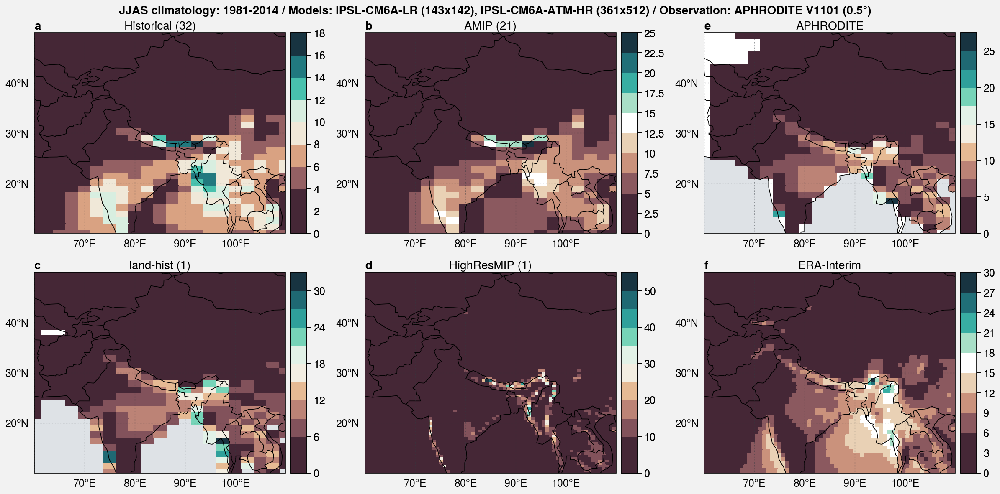

In [15]:
#Check colorbars 

f, axs = plot.subplots([[1, 2, 5], [3, 4, 6]], proj='cyl', share=3, axwidth=3)

for i, ax in enumerate(axs):
    if i < 3:
        m = ax.pcolormesh(concat.isel(exp=i), cmap=cmap, colorbar='r', norm='midpoint')
        ax.format(title=str(concat.isel(exp=i).exp.values))
    
axs[3].pcolormesh(da_HR_clim, cmap=cmap, colorbar='r', norm='midpoint')
axs[3].format(title='HighResMIP (1)') 

axs[4].pcolormesh(obs_regrid_clim, cmap=cmap, colorbar='r', norm='midpoint')
axs[4].format(title=obs_name)

axs[5].pcolormesh(era_clim, cmap=cmap, colorbar='r', norm='midpoint')
axs[5].format(title='ERA-Interim')

axs.format(
    geogridlinewidth=0.5, geogridcolor='gray8', geogridalpha=0.5, labels=True, 
    coast=True, ocean=True, oceancolor='gray3', borders=True,
    suptitle="JJAS climatology: 1981-2014 / Models: IPSL-CM6A-LR (143x142), IPSL-CM6A-ATM-HR (361x512) / Observation: "+obs_longname,
    lonlines=10, latlines=10, abc=True, latlim=latlim, lonlim=lonlim
)

In [16]:
concat.max()

<xarray.DataArray ()>
array(32.37074586)
Coordinates:
    season   <U4 'JJAS'

In [17]:
obs_clim.max()

<xarray.DataArray ()>
array(30.14852139)
Coordinates:
    season   <U4 'JJAS'

/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/proplot/styletools.py:2855: RuntimeWarning: invalid value encountered in true_divide
  distance = (xq - x[idx - 1]) / (x[idx] - x[idx - 1])


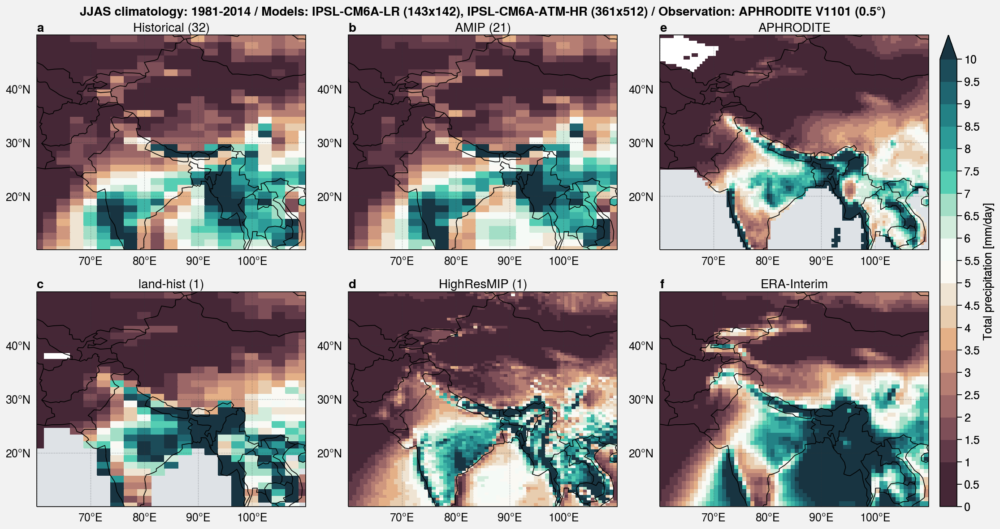

In [24]:
# Final plot

f, axs = plot.subplots([[1, 2, 5], [3, 4, 6]], proj='cyl', share=3, axwidth=3)

extend='max'

for i, ax in enumerate(axs):
    if i < 3:
        m = ax.pcolormesh(concat.isel(exp=i), cmap=cmap, levels=levels, extend=extend, norm='midpoint')
        ax.format(title=str(concat.isel(exp=i).exp.values))
    
axs[3].pcolormesh(da_HR_clim, cmap=cmap, levels=levels, extend=extend, norm='midpoint')
axs[3].format(title='HighResMIP (1)') 

axs[4].pcolormesh(obs_clim, cmap=cmap, levels=levels, extend=extend, norm='midpoint')
axs[4].format(title=obs_name) 

axs[5].pcolormesh(era_clim, cmap=cmap, levels=levels, extend=extend, norm='midpoint')
axs[5].format(title='ERA-Interim')

f.colorbar(m, label=var_label)

axs.format(
    geogridlinewidth=0.5, geogridcolor='gray8', geogridalpha=0.5, labels=True, 
    coast=True, ocean=True, oceancolor='gray3', borders=True,
    suptitle=season+" climatology: 1981-2014 / Models: IPSL-CM6A-LR (143x142), IPSL-CM6A-ATM-HR (361x512) / Observation: "+obs_longname,
    lonlines=10, latlines=10, abc=True, latlim=latlim, lonlim=lonlim
)

f.save('img/'+var+'/'+season+'_clim_'+var+'_IPSL_CMIP6.png')
f.save('img/'+var+'/'+season+'_clim_'+var+'_IPSL_CMIP6.pdf')

# Bias
[#Load-ensemble-mean](#Load-ensemble-mean)  
[#Check-stations](#Check-stations)  
[#Check-monthly-data](#Check-monthly-data)  
[#Annual-Climatology](#Annual-Climatology)  
[#Bias](#Bias)  
[#Annual-cycle-ensemble-mean](#Annual-cycle-ensemble-mean)  
[#Time-series](#Time-series)  
[#Trends](#Trends)  
[#Link-with-orography?](#Link-with-orography?) 

In [20]:
bias = xr.concat(
    [
        (da_historical_clim-obs_regrid_clim),
        (da_amip_clim-obs_regrid_clim),
        (da_land_hist_clim-obs_regrid_clim),
        (da_HR_regrid_clim-obs_regrid_clim)
    ],
    pd.Index(
        [
            'Historical (32) - '+obs_name,
            'AMIP (21) - '+obs_name,
            'land-hist (1) - '+obs_name,
            'HighResMIP (1) - '+obs_name
        ], 
        name='bias'
    )
)

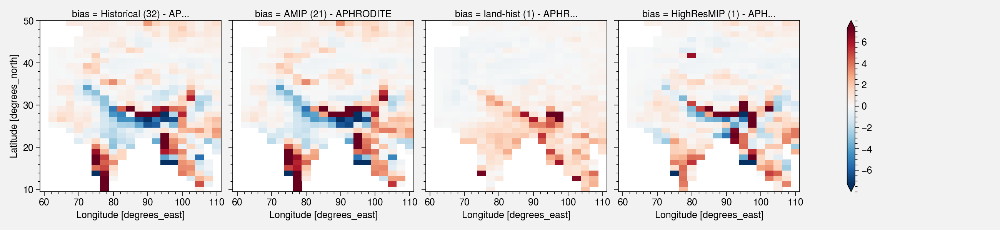

In [21]:
bias.plot(col='bias', robust=True)

In [22]:
bias.min()

<xarray.DataArray ()>
array(-18.23034982)
Coordinates:
    season   <U4 'JJAS'

In [23]:
bias.max()

<xarray.DataArray ()>
array(21.9181434)
Coordinates:
    season   <U4 'JJAS'

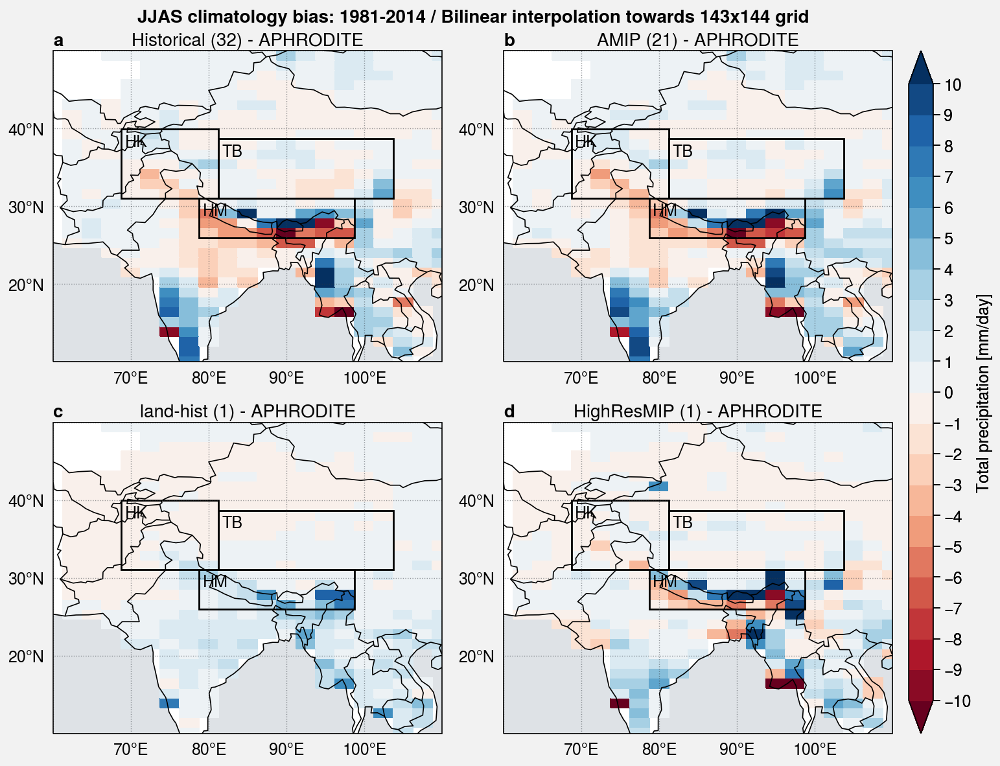

In [25]:
# Final plot

f, axs = plot.subplots(proj='cyl', ncols=2, nrows=2, share=3, axwidth=3)

for i, ax in enumerate(axs):
    m = ax.pcolormesh(
        bias.isel(bias=i), 
        cmap='RdBu', 
        levels=plot.arange(-10,10,1), 
        extend='both',
#         norm='midpoint'
    )
    ax.format(title=str(bias.isel(bias=i).bias.values))

f.colorbar(m, label=var_label)

# Add boxes
for ax in axs:
    u.plot_zones_IPSL_CM6A_LR(ax)

axs.format(
    geogridlinewidth=0.5, geogridcolor='gray8', geogridalpha=0.5, labels=True, 
    coast=True, ocean=True, oceancolor='gray3', borders=True,
    suptitle=season+" climatology bias: 1981-2014 / Bilinear interpolation towards 143x144 grid",
    lonlines=10, latlines=10, abc=True, latlim=latlim, lonlim=lonlim
)

f.save('img/'+var+'/'+var+'_IPSL_CMIP6_bias_'+season+'.png')
f.save('img/'+var+'/'+var+'_IPSL_CMIP6_bias_'+season+'.pdf')

# Link with orography?
[#Load-ensemble-mean](#Load-ensemble-mean)  
[#Check-stations](#Check-stations)  
[#Check-monthly-data](#Check-monthly-data)  
[#Annual-Climatology](#Annual-Climatology)  
[#Bias](#Bias)  
[#Link-with-orography?](#Link-with-orography?)  
[#Annual-cycle-ensemble-mean](#Annual-cycle-ensemble-mean)  
[#Time-series](#Time-series)  
[#Trends](#Trends)   

In [26]:
# Get orog files
orog = xr.open_dataarray(
    '/bdd/CMIP6/CMIP/IPSL/IPSL-CM6A-LR/historical/r1i1p1f1/fx/orog/gr/latest/orog_fx_IPSL-CM6A-LR_historical_r1i1p1f1_gr.nc'
).sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1]))
orog

mean_topo = xr.open_dataarray('mean_topo.nc').sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1]))
std_topo = xr.open_dataarray('std_topo.nc').sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1]))

# Zones
lonlim_HK, latlim_HK, lonlim_HM, latlim_HM, lonlim_TB, latlim_TB = u.get_zones_IPSL_CM6A_LR()

titles = ['HK', 'HM', 'TB']
zone_slices = [
    [slice(lonlim_HK[0],lonlim_HK[1]), slice(latlim_HK[0],latlim_HK[1])],
    [slice(lonlim_HM[0],lonlim_HM[1]), slice(latlim_HM[0],latlim_HM[1])],
    [slice(lonlim_TB[0],lonlim_TB[1]), slice(latlim_TB[0],latlim_TB[1])]
]

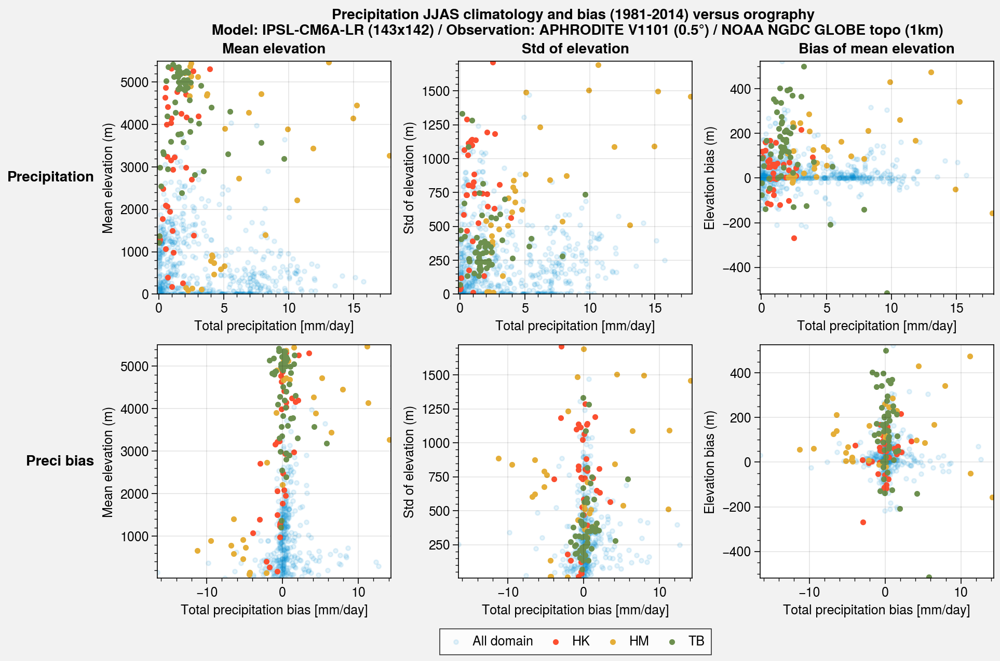

In [27]:
plot.rc.cycle = '538'

# Figure
f, axs = plot.subplots(nrows=2, ncols=3, share=0)

x = [concat[0], bias[0]]
xlabels = [var_label, var_label_bias]
y = [orog, std_topo, (orog-mean_topo)]
ylabels = ['Mean elevation (m)', 'Std of elevation (m)', 'Elevation bias (m)']

for i, ax in enumerate(axs):
    # ALL
    h1 = ax.scatter(x[i//3].values.flatten(), y[i%3].values.flatten(), alpha=0.1, label='All domain')
    # HK
    h2 = ax.scatter(
        x[i//3].sel(lon=zone_slices[0][0], lat=zone_slices[0][1]).values.flatten(), 
        y[i%3].sel(lon=zone_slices[0][0], lat=zone_slices[0][1]).values.flatten(), 
        label=titles[0]
    )
    # HM
    h3 = ax.scatter(
        x[i//3].sel(lon=zone_slices[1][0], lat=zone_slices[1][1]).values.flatten(), 
        y[i%3].sel(lon=zone_slices[1][0], lat=zone_slices[1][1]).values.flatten(), 
        label=titles[1]
    )
    # TB
    h4 = ax.scatter(
        x[i//3].sel(lon=zone_slices[2][0], lat=zone_slices[2][1]).values.flatten(), 
        y[i%3].sel(lon=zone_slices[2][0], lat=zone_slices[2][1]).values.flatten(), 
        label=titles[2]
    )
    ax.format(xlabel=xlabels[i//3], ylabel=ylabels[i%3])

axs.format(
    suptitle='Precipitation '+season+' climatology and bias (1981-2014) versus orography \n Model: IPSL-CM6A-LR (143x142) / Observation: '+obs_longname+' / NOAA NGDC GLOBE topo (1km)',
    collabels=['Mean elevation', 'Std of elevation', 'Bias of mean elevation'],
    rowlabels=['Precipitation', 'Preci bias']
)

hs = [h1, h2, h3, h4]
f.legend(hs, loc='b', ncols=4, order='F', center=False, frame=True)

f.save('img/'+var+'/orog_'+var+'_'+season+'.png')
f.save('img/'+var+'/orog_'+var+'_'+season+'.pdf')

## Obs vs model

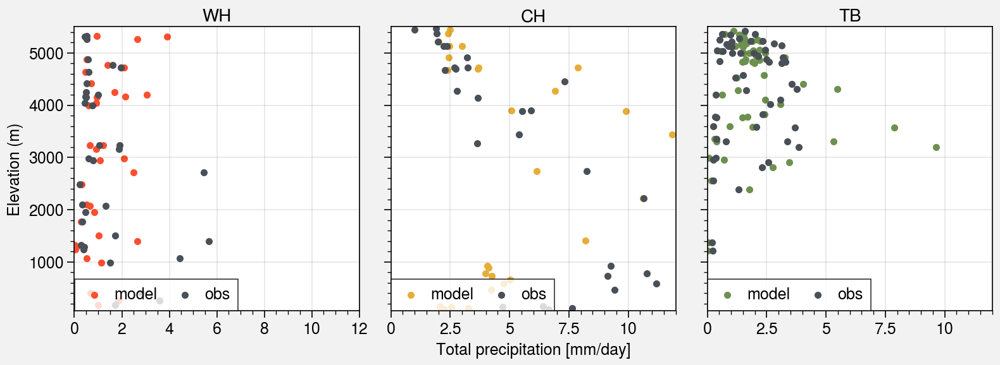

In [28]:
plot.rc.cycle = '538'

# Figure
f, axs = plot.subplots(nrows=1, ncols=3, share=3)
labels=['WH', 'CH', 'TB']
colors=['C1','C2','C3']

for i, ax in enumerate(axs):
    # Model
    ##########################
    x = concat[0].sel(lon=zone_slices[i][0], lat=zone_slices[i][1]).values.flatten()
    y = orog.sel(lon=zone_slices[i][0], lat=zone_slices[i][1]).values.flatten()
    xlabels = var_label
    ylabels = 'Elevation (m)'
    
    h1 = ax.scatter(x, y, label='model', color=colors[i])

    # Obs
    ###########################
    x = obs_regrid_clim.sel(lon=zone_slices[i][0], lat=zone_slices[i][1]).values.flatten()
    h2 = ax.scatter(x, y, label='obs', color='gray7')


    ax.format(
        xlabel=xlabels, ylabel=ylabels, 
        xlim=(0,12), 
#         ylim=(0,5600), 
        title=labels[i]
    )
    
    hs = [h1, h2]
    ax.legend(hs, loc='ll')
    

f.save('img/'+var+'/orog_'+var+'_obs_model_'+season+'.png')
f.save('img/'+var+'/orog_'+var+'_obs_model_'+season+'.pdf')

# Annual cycle ensemble mean
[#Load-ensemble-mean](#Load-ensemble-mean)  
[#Check-stations](#Check-stations)  
[#Check-monthly-data](#Check-monthly-data)  
[#Annual-Climatology](#Annual-Climatology)  
[#Bias](#Bias)  
[#Link-with-orography?](#Link-with-orography?)  
[#Annual-cycle-ensemble-mean](#Annual-cycle-ensemble-mean)  
[#Time-series](#Time-series)  
[#Trends](#Trends)  
## Charger tout comme ça on fait les cycles annuels + time series avec le shading sur les 3 zones à la volé

In [29]:
plot.rc.cycle = 'colorblind'

realization = '*'
da_historical_ens = xr.open_mfdataset(
    '/bdd/CMIP6/CMIP/'+institute+'/'+model+'/historical/'+realization+'/'+table+'/'+var+'/gr/latest/*.nc', 
    combine='nested', concat_dim='realization', parallel=True
).sel(time=period, lon=slice(lonlim[0],lonlim[1]), lat=slice(latlim[0],latlim[1]))[var].load()

da_amip_ens = xr.open_mfdataset(
    '/bdd/CMIP6/CMIP/'+institute+'/'+model+'/amip/'+realization+'/'+table+'/'+var+'/gr/latest/*-201412.nc', 
    combine='nested', concat_dim='realization', parallel=True
).sel(time=period, lon=slice(lonlim[0],lonlim[1]), lat=slice(latlim[0],latlim[1]))[var].load()

In [30]:
da_historical_ens

<xarray.DataArray 'pr' (realization: 32, time: 408, lat: 32, lon: 21)>
array([[[[2.82460496e-05, 3.99401833e-05, 7.59101968e-05, ...,
          0.00000000e+00, 9.62097624e-10, 1.53777000e-05],
         [1.65145848e-05, 3.12449338e-05, 9.63538187e-05, ...,
          0.00000000e+00, 6.42719939e-08, 9.40244445e-06],
         [1.56632250e-05, 3.37696656e-05, 7.29363237e-05, ...,
          0.00000000e+00, 1.78351650e-06, 7.78922094e-06],
         ...,
         [8.05490981e-06, 9.92342484e-06, 1.00506713e-05, ...,
          3.44116665e-06, 1.68117333e-06, 7.02484385e-07],
         [1.02757631e-05, 1.32422829e-05, 1.74138877e-05, ...,
          5.35192203e-06, 4.78836728e-06, 7.36033144e-07],
         [1.30090912e-05, 1.64123867e-05, 1.90269748e-05, ...,
          3.18711977e-06, 1.06267817e-05, 4.52830818e-06]],

        [[9.14731913e-07, 4.07134348e-06, 3.07737537e-06, ...,
          6.95099607e-06, 6.28352836e-07, 1.60699267e-06],
         [7.81048357e-07, 3.77964227e-07, 3.83328256e-07, ...,
          7.68032533e-06, 2.35117227e-06, 1.76918218e-06],
         [3.27070950e-07, 6.16777129e-07, 1.10063445e-06, ...,
          5.07296681e-06, 6.78954530e-06, 9.71211165e-08],
         ...,
         [5.00024225e-06, 4.52226732e-06, 5.81287213e-06, ...,
          1.45471233e-06, 1.46548609e-06, 1.30405499e-06],
         [3.25991005e-06, 4.69000224e-06, 7.88817397e-06, ...,
          3.27512521e-06, 4.09538006e-06, 9.22414642e-07],
         [2.97117981e-06, 6.25385337e-06, 1.15198291e-05, ...,
          1.34584786e-06, 8.06799835e-06, 4.59197872e-06]],

        [[3.57941900e-07, 2.60375288e-07, 1.33433574e-07, ...,
          1.67858288e-05, 3.46765205e-06, 2.49181062e-06],
         [1.58781631e-07, 5.37904953e-07, 2.80070822e-07, ...,
          2.83161189e-05, 9.54696134e-06, 2.53483813e-06],
         [3.19650383e-07, 1.95588328e-07, 1.33538322e-07, ...,
          2.84381567e-05, 2.18540335e-05, 1.01713601e-06],
         ...,
         [9.75968396e-06, 9.84383860e-06, 1.40103793e-05, ...,
          3.70450630e-06, 4.06365598e-06, 5.35720756e-06],
         [1.64760258e-05, 1.40433094e-05, 1.90604278e-05, ...,
          2.17914635e-06, 5.23689368e-06, 7.07294430e-06],
         [1.46998173e-05, 1.67774269e-05, 1.63413570e-05, ...,
          3.50432902e-06, 9.32446255e-06, 2.38860484e-05]],

        ...,

        [[5.48402095e-05, 1.14441653e-04, 7.59897302e-05, ...,
          7.18128867e-05, 1.55295595e-04, 1.15528324e-04],
         [5.22629998e-05, 1.34626389e-04, 1.17827673e-04, ...,
          8.35911414e-05, 1.54073481e-04, 1.84311459e-04],
         [4.95884087e-05, 7.84873482e-05, 9.20376042e-05, ...,
          7.86320234e-05, 1.82792326e-04, 2.17486944e-04],
         ...,
         [8.45775332e-07, 2.73837259e-06, 5.24313509e-06, ...,
          6.02708997e-06, 2.21275855e-06, 2.42358283e-06],
         [5.87417071e-06, 9.73875467e-06, 1.64541652e-05, ...,
          4.94481083e-06, 1.61433873e-05, 6.55266513e-06],
         [3.99836472e-06, 6.42351142e-06, 1.39322447e-05, ...,
          1.48297443e-06, 1.83304965e-05, 1.93158339e-05]],

        [[1.39290831e-04, 1.18706586e-04, 1.01793688e-04, ...,
          4.20615033e-05, 1.29189080e-04, 3.94622475e-04],
         [6.12770236e-05, 7.99260088e-05, 6.15494137e-05, ...,
          1.34260881e-05, 1.06488005e-04, 4.47881263e-04],
         [2.29269954e-05, 5.09235397e-05, 6.94309056e-05, ...,
          1.65107360e-06, 4.11918991e-05, 2.56848696e-04],
         ...,
         [9.08502784e-07, 1.20933487e-06, 5.16474574e-06, ...,
          4.23347637e-06, 2.83873283e-06, 8.18565297e-07],
         [4.49607387e-06, 1.09353605e-05, 1.45841386e-05, ...,
          2.96632606e-06, 5.42944372e-06, 8.03015212e-07],
         [1.91881736e-05, 1.42863928e-05, 1.22249512e-05, ...,
          2.32273305e-06, 1.08745162e-05, 8.25673851e-06]],

        [[3.08177769e-05, 3.57324061e-05, 5.77914652e-05, ...,
          6.76677109e-06, 9.12273299e-06, 1.05828018e-04],
         [4.96678658e-05, 2.37689073e-05, 3.43024622e

In [31]:
da_amip_ens

<xarray.DataArray 'pr' (realization: 21, time: 408, lat: 32, lon: 21)>
array([[[[4.64259392e-05, 3.46237903e-05, 3.80256024e-05, ...,
          1.02386184e-06, 5.38646134e-07, 3.38429891e-05],
         [3.34773795e-05, 2.64575538e-05, 2.58939781e-05, ...,
          1.10425060e-06, 5.70771272e-06, 3.68893925e-05],
         [7.37316623e-06, 9.72894031e-06, 5.47116178e-06, ...,
          0.00000000e+00, 5.34233232e-06, 1.72579803e-05],
         ...,
         [1.09331986e-05, 1.14426794e-05, 1.89755956e-05, ...,
          2.01103740e-06, 2.29339912e-06, 2.47928187e-06],
         [8.90539013e-06, 1.08001886e-05, 1.94574150e-05, ...,
          3.16437786e-06, 4.10172788e-06, 3.22991286e-06],
         [1.09590410e-05, 1.21395833e-05, 1.74841789e-05, ...,
          2.36576238e-06, 5.95102438e-06, 4.62651542e-06]],

        [[9.17031684e-06, 1.57528357e-05, 5.65931550e-05, ...,
          6.77007392e-06, 1.11553028e-07, 3.91951698e-06],
         [1.42292242e-06, 1.18464300e-06, 4.65648518e-05, ...,
          1.56458700e-05, 1.19350616e-05, 3.88376111e-06],
         [1.82436611e-06, 4.42000783e-08, 3.39218277e-05, ...,
          1.50859378e-05, 1.56734659e-05, 4.35449550e-07],
         ...,
         [6.39693462e-06, 5.06222887e-06, 3.20862932e-06, ...,
          2.21334426e-06, 1.60615912e-06, 1.15685634e-06],
         [7.31105411e-06, 6.90979414e-06, 7.28473651e-06, ...,
          4.24535892e-06, 3.69979762e-06, 1.83178975e-06],
         [8.62359502e-06, 8.02724662e-06, 1.07607075e-05, ...,
          3.07696769e-06, 6.92048525e-06, 5.98933002e-06]],

        [[1.83289485e-05, 7.13379850e-05, 4.55782429e-05, ...,
          3.20059917e-05, 1.29321970e-05, 2.26769735e-05],
         [2.88471892e-05, 6.27898407e-05, 3.80759520e-05, ...,
          4.05850187e-05, 3.83779807e-05, 1.76552803e-05],
         [3.37498168e-05, 4.45075711e-05, 1.66530845e-05, ...,
          3.31708543e-05, 4.47028942e-05, 1.42126364e-05],
         ...,
         [1.03847542e-05, 8.49594653e-06, 8.55481903e-06, ...,
          5.92968627e-06, 6.80668109e-06, 5.59461478e-06],
         [1.58171133e-05, 1.24120734e-05, 1.33878711e-05, ...,
          7.61877482e-06, 1.09698376e-05, 7.55264318e-06],
         [1.24145681e-05, 1.59025039e-05, 2.44989278e-05, ...,
          7.22377217e-06, 1.35485598e-05, 1.09902312e-05]],

        ...,

        [[2.83055724e-05, 2.74387821e-05, 2.97179722e-05, ...,
          8.11197024e-05, 7.95235901e-05, 1.36206494e-04],
         [3.58587204e-05, 3.40920378e-05, 3.10750074e-05, ...,
          1.11290159e-04, 2.11521634e-04, 2.06774232e-04],
         [3.72218092e-05, 4.01319485e-05, 3.77545730e-05, ...,
          7.99523405e-05, 2.08557962e-04, 3.76146316e-04],
         ...,
         [1.55499038e-07, 3.60817830e-06, 6.47366733e-06, ...,
          2.25497433e-06, 7.60496732e-07, 1.97702885e-08],
         [1.69158591e-06, 9.67044252e-06, 1.21279991e-05, ...,
          2.34756158e-06, 5.27188240e-06, 7.56880752e-07],
         [2.00131058e-06, 3.79411722e-06, 9.15317014e-06, ...,
          3.66372160e-06, 9.60808757e-06, 1.11422214e-05]],

        [[3.70216658e-05, 3.96087089e-05, 4.19768767e-05, ...,
          4.13341659e-05, 5.76012753e-05, 1.10978377e-04],
         [3.87742766e-05, 3.66529093e-05, 3.85891617e-05, ...,
          3.39706894e-05, 1.01160906e-04, 1.69803316e-04],
         [5.91405587e-05, 4.16762596e-05, 3.61542589e-05, ...,
          2.06796049e-05, 1.10968525e-04, 2.87449802e-04],
         ...,
         [2.30246587e-06, 7.00098417e-06, 4.24999553e-06, ...,
          1.15529144e-06, 3.53200591e-07, 2.37161885e-06],
         [6.15714862e-06, 1.15792200e-05, 1.30081671e-05, ...,
          1.57440866e-06, 8.90786487e-06, 1.75300556e-06],
         [1.36209019e-05, 1.30969356e-05, 1.31964734e-05, ...,
          3.99080545e-06, 1.88220165e-05, 7.65918776e-06]],

        [[4.22722806e-05, 4.62809912e-05, 9.23207044e-05, ...,
          2.06625537e-05, 3.63948457e-05, 9.50740869e-05],
         [2.20014645e-05, 3.02849512e-05, 5.67873758e

In [32]:
# To mm/day
da_historical_ens = da_historical_ens*86400
da_amip_ens = da_amip_ens*86400

In [33]:
lonlim_HK, latlim_HK, lonlim_HM, latlim_HM, lonlim_TB, latlim_TB = u.get_zones_IPSL_CM6A_LR()

titles = ['HK', 'HM', 'TB']
zone_slices = [
    [slice(lonlim_HK[0],lonlim_HK[1]), slice(latlim_HK[0],latlim_HK[1])],
    [slice(lonlim_HM[0],lonlim_HM[1]), slice(latlim_HM[0],latlim_HM[1])],
    [slice(lonlim_TB[0],lonlim_TB[1]), slice(latlim_TB[0],latlim_TB[1])]
]

# Time series
[#Load-ensemble-mean](#Load-ensemble-mean)  
[#Check-stations](#Check-stations)  
[#Check-monthly-data](#Check-monthly-data)  
[#Annual-Climatology](#Annual-Climatology)  
[#Bias](#Bias)  
[#Link-with-orography?](#Link-with-orography?)  
[#Annual-cycle-ensemble-mean](#Annual-cycle-ensemble-mean)  
[#Time-series](#Time-series)  
[#Trends](#Trends)   

## anomalies - u.clim(obs)

/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: 

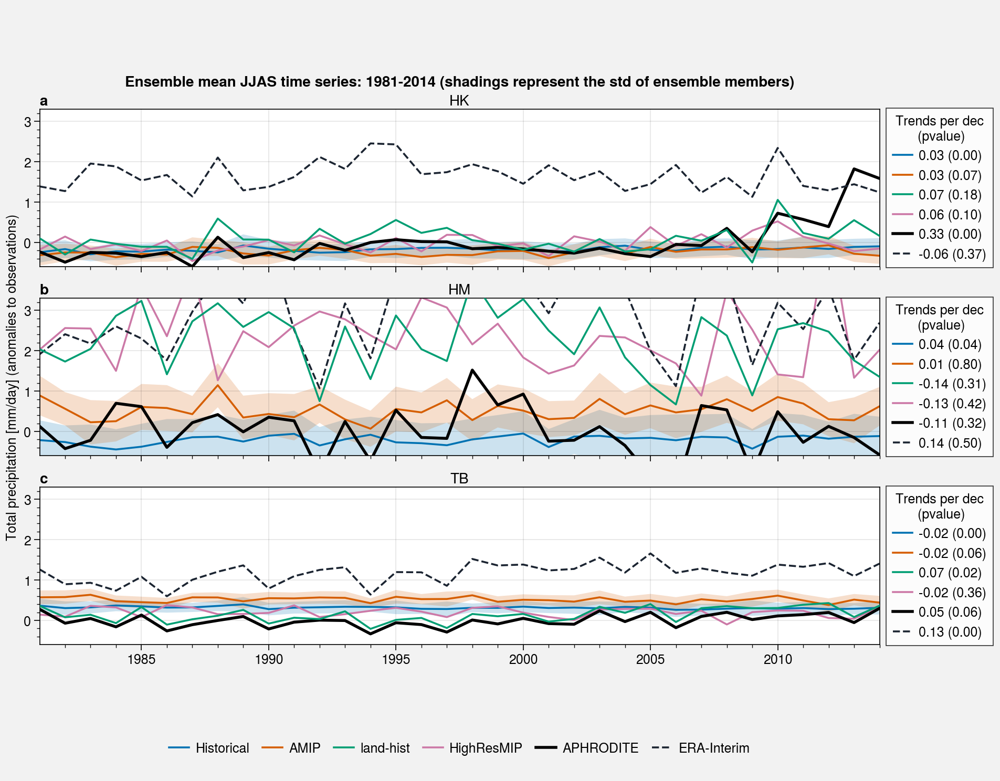

In [34]:
f, axs = plot.subplots(ncols=1, nrows=3, axwidth=8, axheight=1.5, share=3, hspace=0.3)

for i, ax in enumerate(axs):
    
    # Compute time series on the zone
    # Ensemble
    ym_historical_ens = (u.year_mean(u.spatial_average(da_historical_ens.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season=season) \
              - u.custom_season_clim(u.spatial_average(obs_regrid.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season=season)).load()
    ym_amip_ens = (u.year_mean(u.spatial_average(da_amip_ens.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season=season) \
        - u.custom_season_clim(u.spatial_average(obs_regrid.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season=season)).load()


    # Not ensemble
    ym_land_hist = (u.year_mean(u.spatial_average(da_land_hist.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season=season) \
         - u.custom_season_clim(u.spatial_average(obs_regrid.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season=season)).load()
    ym_HR_regrid = (u.year_mean(u.spatial_average(da_HR_regrid.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season=season) \
         - u.custom_season_clim(u.spatial_average(obs_regrid.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season=season)).load()
    ym_obs_regrid = (u.year_mean(u.spatial_average(obs_regrid.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season=season) \
          - u.custom_season_clim(u.spatial_average(obs_regrid.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season=season)).load()
    ym_era_regrid = (u.year_mean(u.spatial_average(era_regrid.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season=season) \
          - u.custom_season_clim(u.spatial_average(obs_regrid.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season=season)).load()    
        
    
    # historical
    x = ym_historical_ens.year
    y = ym_historical_ens.mean('realization')
    std = ym_historical_ens.std('realization')
    h1 = y.plot(ax=ax, label='Historical')
    ax.fill_between(x, y-std, y+std, alpha=0.2)
    r = stats.linregress(x, y)
    t1 = '{:.2f}'.format(r.slope*10) + ' ({:.2f})'.format(r.pvalue)
    
    # amip
    x = ym_amip_ens.year
    y = ym_amip_ens.mean('realization')
    std = ym_historical_ens.std('realization')
    h2 = y.plot(ax=ax, label='AMIP')
    ax.fill_between(x, y-std, y+std, alpha=0.2)
    r = stats.linregress(x, y)
    t2 = '{:.2f}'.format(r.slope*10) + ' ({:.2f})'.format(r.pvalue)
    
    # land_hist
    y = ym_land_hist
    h3 = y.plot(ax=ax, label='land-hist', zorder=10)
    r = stats.linregress(x, y)
    t3 = '{:.2f}'.format(r.slope*10) + ' ({:.2f})'.format(r.pvalue)
    
    # HighResMIP
    y = ym_HR_regrid
    h4 = y.plot(ax=ax, label='HighResMIP')
    r = stats.linregress(x, y)
    t4 = '{:.2f}'.format(r.slope*10) + ' ({:.2f})'.format(r.pvalue)
    
    # Obs
    y = ym_obs_regrid
    h5 = y.plot(ax=ax, label=obs_name, color='black', linewidth=2)
    r = stats.linregress(x, y)
    t5 = '{:.2f}'.format(r.slope*10) + ' ({:.2f})'.format(r.pvalue)
    
    # ERA
    y = ym_era_regrid
    h6 = y.plot(ax=ax, label='ERA-Interim', color='dark', linestyle='--')
    r = stats.linregress(x, y)
    t6 = '{:.2f}'.format(r.slope*10) + ' ({:.2f})'.format(r.pvalue)
    
    
    ax.format(title=titles[i])
    hs = [h1, h2, h3, h4, h5, h6]
    hs_trends = [h1[0], h2[0], h3[0], h4[0], h5[0], h6[0]] # keep only the handles (not the label)

    ax.legend(hs_trends, [t1, t2, t3, t4, t5, t6], title='Trends per dec\n      (pvalue)', loc='r', ncols=1)


axs.format(
    xlabel='', ylabel=var_label + ' (anomalies to observations)',
    suptitle='Ensemble mean '+season+' time series: 1981-2014 (shadings represent the std of ensemble members)', abc=True,
    ylim=(-0.6,3.3)
)
    
f.legend(hs, loc='b', ncols=6, order='F', center=False, frame=False)

f.save('img/'+var+'/ym_ens_zones_'+var+'_ano-obs_'+season+'.png')
f.save('img/'+var+'/ym_ens_zones_'+var+'_ano-obs_'+season+'.pdf')

## anomalies - u.clim(#) ("unbiased")

/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: 

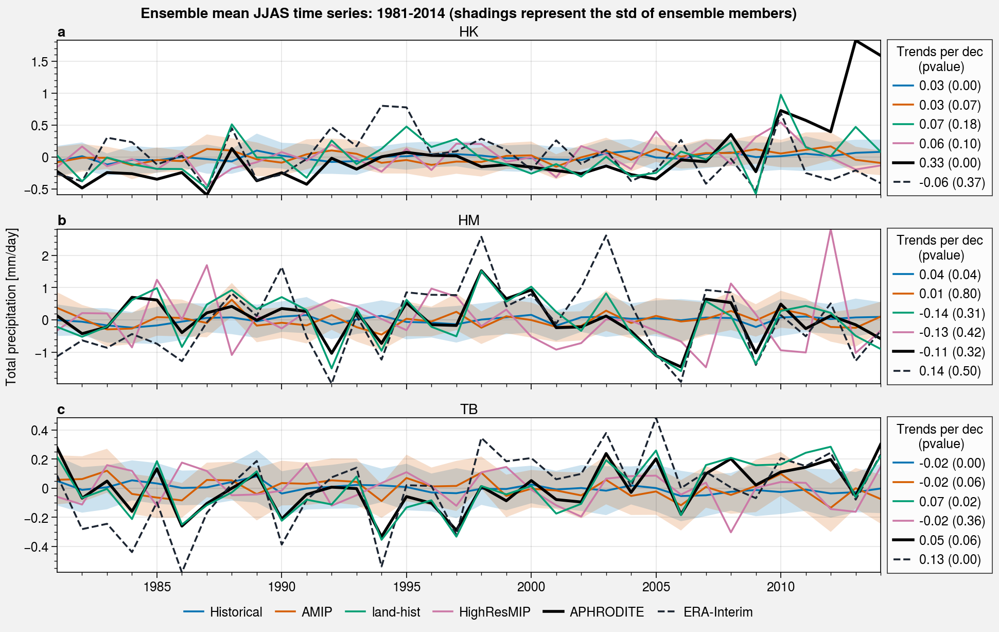

In [35]:
f, axs = plot.subplots(ncols=1, nrows=3, axwidth=8, axheight=1.5, share=3)

for i, ax in enumerate(axs):
    
    # Compute time series on the zone
    # Ensemble
    ym_historical_ens = (u.year_mean(u.spatial_average(da_historical_ens.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season=season) \
              - u.custom_season_clim(u.spatial_average(da_historical_ens.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season=season)).load()
    ym_amip_ens = (u.year_mean(u.spatial_average(da_amip_ens.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season=season) \
        - u.custom_season_clim(u.spatial_average(da_amip_ens.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season=season)).load()


    # Not ensemble
    ym_land_hist = (u.year_mean(u.spatial_average(da_land_hist.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season=season) \
         - u.custom_season_clim(u.spatial_average(da_land_hist.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season=season)).load()
    ym_HR_regrid = (u.year_mean(u.spatial_average(da_HR_regrid.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season=season) \
         - u.custom_season_clim(u.spatial_average(da_HR_regrid.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season=season)).load()
    ym_obs_regrid = (u.year_mean(u.spatial_average(obs_regrid.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season=season) \
          - u.custom_season_clim(u.spatial_average(obs_regrid.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season=season)).load()
    ym_era_regrid = (u.year_mean(u.spatial_average(era_regrid.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season=season) \
          - u.custom_season_clim(u.spatial_average(era_regrid.sel(lon=zone_slices[i][0], lat=zone_slices[i][1])), season=season)).load()    
        
    
    # historical
    x = ym_historical_ens.year
    y = ym_historical_ens.mean('realization')
    std = ym_historical_ens.std('realization')
    h1 = y.plot(ax=ax, label='Historical')
    ax.fill_between(x, y-std, y+std, alpha=0.2)
    r = stats.linregress(x, y)
    t1 = '{:.2f}'.format(r.slope*10) + ' ({:.2f})'.format(r.pvalue)
    
    # amip
    x = ym_amip_ens.year
    y = ym_amip_ens.mean('realization')
    std = ym_historical_ens.std('realization')
    h2 = y.plot(ax=ax, label='AMIP')
    ax.fill_between(x, y-std, y+std, alpha=0.2)
    r = stats.linregress(x, y)
    t2 = '{:.2f}'.format(r.slope*10) + ' ({:.2f})'.format(r.pvalue)
    
    # land_hist
    y = ym_land_hist
    h3 = y.plot(ax=ax, label='land-hist', zorder=10)
    r = stats.linregress(x, y)
    t3 = '{:.2f}'.format(r.slope*10) + ' ({:.2f})'.format(r.pvalue)
    
    # HighResMIP
    y = ym_HR_regrid
    h4 = y.plot(ax=ax, label='HighResMIP')
    r = stats.linregress(x, y)
    t4 = '{:.2f}'.format(r.slope*10) + ' ({:.2f})'.format(r.pvalue)
    
    # Obs
    y = ym_obs_regrid
    h5 = y.plot(ax=ax, label=obs_name, color='black', linewidth=2)
    r = stats.linregress(x, y)
    t5 = '{:.2f}'.format(r.slope*10) + ' ({:.2f})'.format(r.pvalue)
    
    # ERA
    y = ym_era_regrid
    h6 = y.plot(ax=ax, label='ERA-Interim', color='dark', linestyle='--')
    r = stats.linregress(x, y)
    t6 = '{:.2f}'.format(r.slope*10) + ' ({:.2f})'.format(r.pvalue)
    
    
    ax.format(title=titles[i])
    hs = [h1, h2, h3, h4, h5, h6]
    hs_trends = [h1[0], h2[0], h3[0], h4[0], h5[0], h6[0]] # keep only the handles (not the label)

    ax.legend(hs_trends, [t1, t2, t3, t4, t5, t6], title='Trends per dec\n      (pvalue)', loc='r', ncols=1)


axs.format(
    xlabel='', ylabel=var_label,
    suptitle='Ensemble mean '+season+' time series: 1981-2014 (shadings represent the std of ensemble members)', abc=True,
#     ylim=(-11,11)
)
    
f.legend(hs, loc='b', ncols=6, order='F', center=False, frame=False)

f.save('img/'+var+'/ym_ens_zones_'+var+'_'+season+'.png')
f.save('img/'+var+'/ym_ens_zones_'+var+'_'+season+'.pdf')

# Trends
[#Load-ensemble-mean](#Load-ensemble-mean)  
[#Check-stations](#Check-stations)  
[#Check-monthly-data](#Check-monthly-data)  
[#Annual-Climatology](#Annual-Climatology)  
[#Bias](#Bias)  
[#Link-with-orography?](#Link-with-orography?)  
[#Annual-cycle-ensemble-mean](#Annual-cycle-ensemble-mean)  
[#Time-series](#Time-series)  
[#Trends](#Trends)   

Linregress: https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.linregress.html  
Issues linregress: https://github.com/scipy/scipy/issues/7074  
How to parallelize/vectorize: https://stackoverflow.com/questions/52094320/with-xarray-how-to-parallelize-1d-operations-on-a-multidimensional-dataset
Xarray / Dask example: http://martin-jung.github.io/post/2018-xarrayregression/

In [36]:
def corr(x, y, dim):
    return xr.apply_ufunc(
        stats.linregress, x, y,
        input_core_dims=[[dim], [dim]],
        output_core_dims=[[], [], [], [], []],
        vectorize=True
    )

In [37]:
# Add directly the results of linregress to arrays
# Compute year mean first
latlim=(10,50)
lonlim=(60,110)

ym_historical = u.year_mean(da_historical.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])), season=season)
ym_historical.load()
for arr_name, arr in zip(['slope', 'intercept', 'rvalue', 'pvalue', 'stderr'], corr(ym_historical.year, ym_historical, 'year')):
    ym_historical[arr_name] = arr

ym_amip = u.year_mean(da_amip.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])), season=season)
ym_amip.load()
for arr_name, arr in zip(['slope', 'intercept', 'rvalue', 'pvalue', 'stderr'], corr(ym_amip.year, ym_amip, 'year')):
    ym_amip[arr_name] = arr

ym_land_hist = u.year_mean(da_land_hist.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])), season=season)
ym_land_hist.load()
for arr_name, arr in zip(['slope', 'intercept', 'rvalue', 'pvalue', 'stderr'], corr(ym_land_hist.year, ym_land_hist, 'year')):
    ym_land_hist[arr_name] = arr

ym_HR_regrid = u.year_mean(da_HR_regrid.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])), season=season)
ym_HR_regrid.load()
for arr_name, arr in zip(['slope', 'intercept', 'rvalue', 'pvalue', 'stderr'], corr(ym_HR_regrid.year, ym_HR_regrid, 'year')):
    ym_HR_regrid[arr_name] = arr

ym_HR = u.year_mean(da_HR.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])), season=season)
ym_HR.load()
for arr_name, arr in zip(['slope', 'intercept', 'rvalue', 'pvalue', 'stderr'], corr(ym_HR.year, ym_HR, 'year')):
    ym_HR[arr_name] = arr
    
ym_obs_regrid = u.year_mean(obs_regrid.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])), season=season)
ym_obs_regrid.load()
for arr_name, arr in zip(['slope', 'intercept', 'rvalue', 'pvalue', 'stderr'], corr(ym_obs_regrid.year, ym_obs_regrid, 'year')):
    ym_obs_regrid[arr_name] = arr

ym_obs = u.year_mean(obs.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])), season=season)
ym_obs.load()
for arr_name, arr in zip(['slope', 'intercept', 'rvalue', 'pvalue', 'stderr'], corr(ym_obs.year, ym_obs, 'year')):
    ym_obs[arr_name] = arr

ym_era_regrid = u.year_mean(era_regrid.sel(lat=slice(latlim[0],latlim[1]), lon=slice(lonlim[0],lonlim[1])), season=season)
ym_era_regrid.load()
for arr_name, arr in zip(['slope', 'intercept', 'rvalue', 'pvalue', 'stderr'], corr(ym_era_regrid.year, ym_era_regrid, 'year')):
    ym_era_regrid[arr_name] = arr

ym_era = u.year_mean(era.sel(lat=slice(latlim[1],latlim[0]), lon=slice(lonlim[0],lonlim[1])), season=season)
ym_era.load()
for arr_name, arr in zip(['slope', 'intercept', 'rvalue', 'pvalue', 'stderr'], corr(ym_era.year, ym_era, 'year')):
    ym_era[arr_name] = arr

/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/data/mlalande/miniconda3/envs/work/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


In [38]:
# We remove HR for keeping the resolution

concat = xr.concat(
    [
        ym_historical,
        ym_amip,
        ym_land_hist,
    ],
    pd.Index(
        [
            'Historical (32)',
            'AMIP (21)',
            'land-hist (1)',
        ], 
        name='exp'
    )
)

In [39]:
concat.slope.max()*10

<xarray.DataArray 'slope' ()>
array(1.23890681)

In [40]:
concat.slope.min()*10

<xarray.DataArray 'slope' ()>
array(-1.72496537)

In [41]:
ym_obs.slope.max()*10

<xarray.DataArray 'slope' ()>
array(2.30661253)

In [42]:
ym_obs.slope.min()*10

<xarray.DataArray 'slope' ()>
array(-2.51022173)

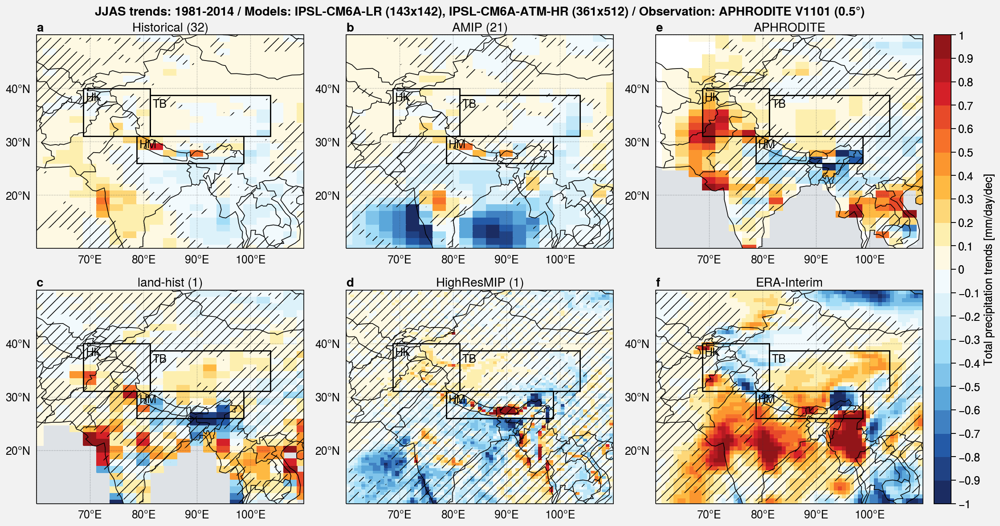

In [43]:
# Final plot

f, axs = plot.subplots([[1, 2, 5], [3, 4, 6]], proj='cyl', share=3, axwidth=3)

cmap='ColdHot'
levels=plot.arange(-1,1,0.1)
extend='neither'

for i, ax in enumerate(axs):
    if i < 3:
        m = ax.pcolormesh(concat.isel(exp=i).slope*10, cmap=cmap, levels=levels, extend=extend)
        if not (np.isnan(concat.isel(exp=i).pvalue.where(concat.isel(exp=i).pvalue>0.05)) == True ).all():
            ax.contourf(concat.isel(exp=i).pvalue.where(concat.isel(exp=i).pvalue>0.05), hatches=['///'], alpha=0)
        ax.format(title=str(concat.isel(exp=i).exp.values))
    
axs[3].pcolormesh(ym_HR.slope*10, cmap=cmap, levels=levels, extend=extend)
axs[3].contourf(ym_HR.pvalue.where(ym_HR.pvalue>0.05), hatches=['///'], alpha=0)
axs[3].format(title='HighResMIP (1)')

axs[4].pcolormesh(ym_obs_regrid.slope*10, cmap=cmap, levels=levels, extend=extend)
axs[4].contourf(ym_obs_regrid.pvalue.where(ym_obs_regrid.pvalue>0.05), hatches=['///'], alpha=0)
axs[4].format(title=obs_name)

axs[5].pcolormesh(ym_era.slope*10, cmap=cmap, levels=levels, extend=extend)
axs[5].contourf(ym_era.pvalue.where(ym_era.pvalue>0.05), hatches=['///'], alpha=0)
axs[5].format(title='ERA-Interim')

f.colorbar(m, label=var_label_trends, formatter=('simple', 3))

# Add boxes
for ax in axs:
    u.plot_zones_IPSL_CM6A_LR(ax)

# Format
axs.format(
    geogridlinewidth=0.5, geogridcolor='gray8', geogridalpha=0.5, labels=True, 
    coast=True, ocean=True, oceancolor='gray3', borders=True,
    suptitle=season+" trends: 1981-2014 / Models: IPSL-CM6A-LR (143x142), IPSL-CM6A-ATM-HR (361x512) / Observation: "+obs_longname,
    lonlines=10, latlines=10, abc=True, latlim=latlim, lonlim=lonlim
)

f.save('img/'+var+'/'+season+'_trends_'+var+'_IPSL_CMIP6.png')
f.save('img/'+var+'/'+season+'_trends_'+var+'_IPSL_CMIP6.pdf')

## Compute trends for all members

In [44]:
ym_historical_ens = u.year_mean(da_historical_ens , season=season)
ym_historical_ens.load()

<xarray.DataArray (realization: 32, year: 34, lat: 32, lon: 21)>
array([[[[ 1.39255116,  2.68667713,  4.11267384, ...,  6.52612224,
           4.9009313 ,  4.59908883],
         [ 1.21888323,  2.38959635,  3.5741075 , ...,  8.83971356,
           8.59567737,  3.4137746 ],
         [ 1.20600782,  2.01421439,  2.99836278, ...,  8.28780436,
           9.91450342,  2.68212813],
         ...,
         [ 0.36259238,  0.11518653,  0.22254219, ...,  2.15336744,
           1.8735448 ,  1.91808982],
         [ 0.65392296,  0.49374072,  0.46751439, ...,  1.87096428,
           2.67108257,  2.26642243],
         [ 1.06369912,  0.98400954,  0.75005975, ...,  2.12376907,
           2.60193548,  3.47803557]],

        [[ 1.47923156,  2.11580842,  3.02531605, ...,  6.89190551,
           5.92969486,  4.62457556],
         [ 1.44507105,  1.86230564,  2.71721088, ...,  9.09143411,
           8.90587553,  3.85124107],
         [ 1.2571648 ,  1.94958425,  2.66319155, ...,  8.28824192,
           9.81775169,  3.04456731],
         ...,
         [ 0.75052099,  0.64053825,  0.79039181, ...,  1.89344083,
           1.48938   ,  1.71818069],
         [ 0.85193978,  0.75235021,  0.6803915 , ...,  1.85784018,
           2.99870213,  3.06558459],
         [ 0.98425753,  0.68561183,  0.59618674, ...,  2.55057057,
           4.02878906,  3.9523013 ]],

        [[ 1.41645708,  2.77923853,  3.37945468, ...,  6.49893814,
           4.84411804,  5.26694855],
         [ 0.46602162,  1.82520091,  3.00238079, ...,  9.13093788,
           8.04781731,  3.59421181],
         [ 0.49764807,  0.64980622,  2.3922476 , ...,  8.32348635,
           9.39303784,  2.94437554],
         ...,
         [ 0.36429088,  0.26486139,  0.12062792, ...,  1.73412532,
           1.67658244,  1.64331593],
         [ 0.48747377,  0.5709833 ,  0.48768917, ...,  1.86388199,
           2.33950242,  2.20131223],
         [ 0.72979994,  0.73934272,  0.81628017, ...,  2.21156376,
           3.26083812,  3.81721317]],

        ...,

        [[ 1.28440723,  2.24781707,  3.21099975, ...,  7.07641809,
           5.34948931,  4.63793184],
         [ 0.89714363,  1.8998998 ,  2.83335981, ...,  9.23113457,
           8.43191953,  3.53896471],
         [ 0.77627152,  1.83419873,  2.57406262, ...,  8.40876937,
           8.83406575,  2.86058971],
         ...,
         [ 0.23437161,  0.28543111,  0.41318116, ...,  1.23692923,
           1.46356686,  1.52579458],
         [ 0.65026064,  0.73073981,  0.66428797, ...,  1.30998497,
           2.60016708,  2.60395067],
         [ 1.14235841,  0.89811014,  0.63764481, ...,  1.83576208,
           2.87221516,  4.57965156]],

        [[ 1.93464721,  2.91408564,  3.6819083 , ...,  6.27643418,
           5.10348641,  4.31075834],
         [ 1.69874842,  2.36837826,  3.4808819 , ...,  8.81363042,
           7.78064477,  3.39745655],
         [ 1.36751178,  1.90531105,  3.11687936, ...,  8.0947153 ,
           9.09205837,  2.59377797],
         ...,
         [ 0.59760322,  0.28940536,  0.85774526, ...,  1.87216013,
           2.05102567,  1.95177713],
         [ 0.89100021,  0.6450774 ,  0.88368312, ...,  2.11316638,
           2.42047324,  2.03972614],
         [ 1.06710161,  0.90433648,  0.96261431, ...,  1.87209984,
           2.15060687,  2.61950604]],

        [[ 1.74559801,  2.67165739,  3.88679207, ...,  6.28531914,
           5.03875499,  4.19234617],
         [ 1.32844596,  2.51729788,  4.26998944, ...,  8.4748487 ,
           7.95635969,  3.72790493],
         [ 1.33964484,  1.88264413,  3.85779183, ...,  7.7496087 ,
           8.70825527,  2.83640135],
         ...,
         [ 0.61928576,  0.44736732,  0.73178641, ...,  2.48582773,
           2.2468638 ,  2.06942781],
         [ 0.81346595,  0.83501506,  0.84244981, ...,  2.73759888,
           3.60401682,  3.33292627],
         [ 1.0264267 ,  1.09124493,  1.14433725, ...,  3.63785742,
           2.87972345,  4.10128906]]],


       [[[ 1.63721646,  2.74375666,  3.19351538, ...,  5.61462997,
           4

In [45]:
for arr_name, arr in zip(['slope', 'intercept', 'rvalue', 'pvalue', 'stderr'], corr(ym_historical_ens.year, ym_historical_ens, 'year')):
    ym_historical_ens[arr_name] = arr

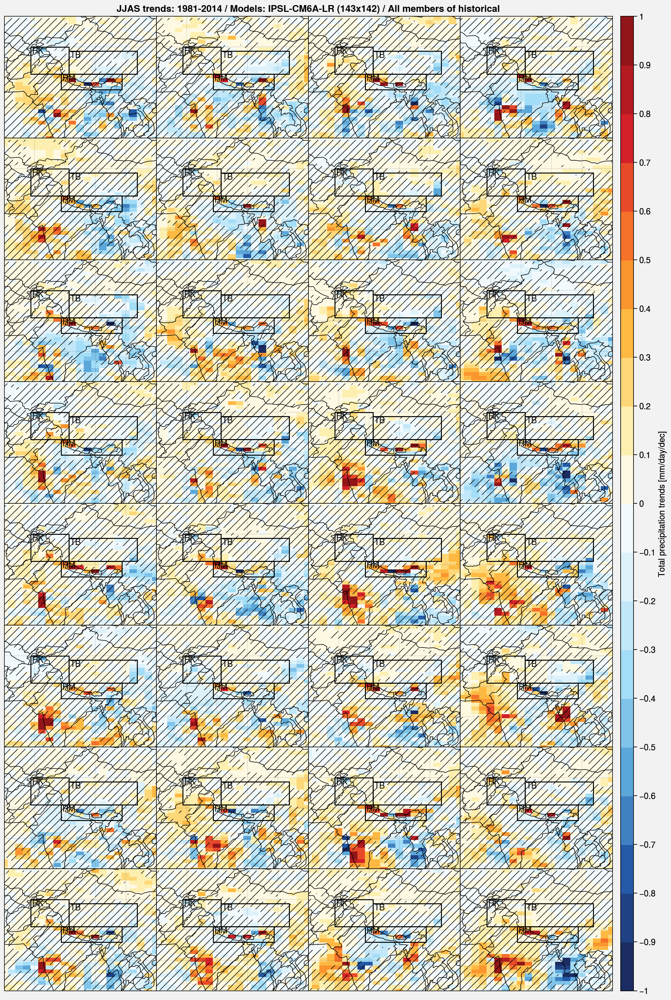

In [46]:
# Final plot

f, axs = plot.subplots(ncols=4, nrows=8, proj='cyl', space=0)

cmap='ColdHot'
levels=plot.arange(-1,1,0.1)
extend='neither'

for i, ax in enumerate(axs):
    m = ax.pcolormesh(ym_historical_ens[i].slope*10, cmap=cmap, levels=levels, extend=extend)
    if not (np.isnan(ym_historical_ens[i].pvalue.where(ym_historical_ens[i].pvalue>0.05)) == True ).all():
        ax.contourf(
            ym_historical_ens[i].pvalue.where(ym_historical_ens[i].pvalue>0.05), hatches=['///'], alpha=0
        )
    ax.format(title='')

f.colorbar(m, label=var_label_trends, formatter=('simple', 3))

# Add boxes
for ax in axs:
    u.plot_zones_IPSL_CM6A_LR(ax)

# Format
axs.format(
    geogridlinewidth=0.5, geogridcolor='gray8', geogridalpha=0.5, labels=False, 
    coast=True, ocean=True, oceancolor='gray3', borders=True,
    suptitle=season+" trends: 1981-2014 / Models: IPSL-CM6A-LR (143x142) / All members of historical",
    lonlines=10, latlines=10, abc=False, latlim=latlim, lonlim=lonlim
)

f.save('img/'+var+'/'+season+'_trends_'+var+'_IPSL_CMIP6_ens_historical.png')
f.save('img/'+var+'/'+season+'_trends_'+var+'_IPSL_CMIP6_ens_historical.pdf')